# Physics 5300 Final Problem Set: Double (and more) Pendulum


#### Cassie Moats

In [1]:
# import statements 

%matplotlib inline

import numpy as np
from scipy.integrate import solve_ivp

import matplotlib.pyplot as plt
from IPython.display import Image, HTML

from matplotlib import animation, rc

In [2]:
# changing the font sizes

font_size = 12
plt.rcParams.update({'font.size': font_size})

not assuming small angle approximation

In [3]:
Image(url='https://upload.wikimedia.org/wikipedia/commons/7/78/Double-Pendulum.svg')

As a basis for the double pendulum, I'll use the picture from [the Wikipedia article on the double pendulum](https://en.wikipedia.org/wiki/Double_pendulum). For Cartesian coordinates, x direction is pointing to the right and the y direction is pointing down. The generalized coordinates are $\theta_1$ and $\theta_2$, where each is the angle from the origin (where the pendulum is attached to the ceiling). 

The position equations follow as:
<center><span style="color:blue">$x_1 = L_1 sin \theta_1$ </span></center>
<center><span style="color:blue">$y_1 = L_1 cos \theta_1$</span></center>

<center><span style="color:red">$x_2 = x_1 + L_2 sin \theta_2 = L_1 sin \theta_1 + L_2 sin \theta_2$</span></center>

<center><span style="color:red">$y_2 = y_1 + L_2 cos \theta_2 = L_1 cos \theta_1 + L_2 cos \theta_2$ </span></center>
    
The velocity equations are then:

<center><span style="color:blue">
        $\dot x_1 = L_1 \dot\theta_1 cos \theta_1$</span></center>
        
        
<center><span style="color:blue">$\dot y_1 = -L_1 \dot\theta_1 sin \theta_1$</span></center>
<center><span style="color:red">$\dot x_2 = \dot x_1 + L_2 \dot\theta_2 cos \theta_2 = L_1 \dot\theta_1 cos \theta_1 + L_2 \dot\theta_2 cos \theta_2$ </span> </center>
<center><span style="color:red">$\dot y_2 = \dot y_1 + -L_2 \dot\theta_2 sin \theta_2 = -L_1 \dot\theta_1 sin \theta_1 - L_2 \dot\theta_2 sin \theta_2$</span></center>

Now onto calcuating T: 

$$T = \frac{1}{2}m_1v_1^2 + \frac{1}{2}m_2v_2^2$$
$$T = \frac{1}{2}m_1(\dot x_1^2 + \dot y_1^2) + \frac{1}{2}m_2(\dot x_2^2 + \dot y_2^2) $$ 
$$T = \frac{1}{2}m_1[(L_1 \dot\theta_1 cos \theta_1)^2 + 
 (-L_1 \dot\theta_1 sin \theta_1)^2] 
+ \frac{1}{2}m_2[(L_1 \dot\theta_1 cos \theta_1 + L_2 \dot\theta_2 cos \theta_2)^2 + (-L_1 \dot\theta_1 sin \theta_1 - L_2 \dot\theta_2 sin \theta_2)^2]$$

$$T = \frac{1}{2}m_1 (L_1^2 \dot\theta_1^2 cos^2 \theta_1 + L_1^2 \dot\theta_1^2 sin^2 \theta_1) + \frac{1}{2}m_2[(L_1 \dot\theta_1 cos \theta_1 + L_2 \dot\theta_2 cos \theta_2)^2 +  (-L_1 \dot\theta_1 sin \theta_1 - L_2 \dot\theta_2 sin \theta_2)^2]$$

$$T = \frac{1}{2}m_1 L_1^2 \dot\theta_1^2 (cos^2 \theta_1 + sin^2 \theta_1) + \frac{1}{2}m_2 [L_1^2 \dot\theta_1^2 cos^2 \theta_1 + 2 L_1 L_2 \dot\theta_1 \dot\theta_2 cos \theta_1 cos \theta_2 + L_2^2 \dot\theta_2^2 cos^2 \theta_2 + L_1^2 \dot\theta_1^2 sin^2 \theta_1 + 2 L_1  L_2 \dot\theta_1 \dot\theta_2 sin \theta_1 sin \theta_2 + L_2^2 \dot\theta_2^2 sin^2 \theta_2]$$

Using $cos^2 a + sin^2 a = 1$:

$$T = \frac{1}{2}m_1 L_1^2 \dot\theta_1^2 + \frac{1}{2}m_2[L_2^2 \dot\theta_2^2 (cos^2 \theta_2 + sin^2 \theta_2) + L_1^2 \dot\theta_1^2 (cos^2 \theta_1 + sin^2 \theta_1) + 2 L_1 L_2 \dot\theta_1 \dot\theta_2 (cos \theta_1 cos \theta_2  + sin \theta_1 sin \theta_2)]$$

Using $ cos(a) cos(b) + sin(a) sin(b) = cos(a-b) $:

$$T = \frac{1}{2}m_1 L_1^2 \dot\theta_1^2 + \frac{1}{2}m_2[L_2^2 \dot\theta_2^2 + L_1^2 \dot\theta_1^2 + 2 L_1 L_2 \dot\theta_1 \dot\theta_2 (cos (\theta_1 - \theta_2)]$$

$$T = \frac{1}{2}m_1 L_1^2 \dot\theta_1^2 + \frac{1}{2}m_2 L_2^2 \dot\theta_2^2 + \frac{1}{2}m_2 L_1^2 \dot\theta_1^2 + m_2L_1 L_2 \dot\theta_1 \dot\theta_2cos (\theta_1 - \theta_2)$$

$$T = \frac{1}{2}(m_1+m_2) L_1^2 \dot\theta_1^2 + \frac{1}{2}m_2 L_2^2 \dot\theta_2^2 + m_2L_1 L_2 \dot\theta_1 \dot\theta_2cos (\theta_1 - \theta_2)$$

Now to calucate U: $$U = -m_1gy_1 - m_2gy_2$$

$$U = -m_1 g(L_1 cos \theta_1) - m_2 g(L_1 cos \theta_1 + L_2 cos \theta_2)$$

$$U = -m_1 g L_1 cos \theta_1 - m_2 g L_1 cos \theta_1 - m_2 g  L_2 cos \theta_2$$

$$U = -(m_1 + m_2) g L_1 cos \theta_1 - m_2 g L_2 cos \theta_2$$

Now for the Lagrangian, $\mathcal{L}$: 
$$\mathcal{L} = T - U$$
$$\mathcal{L} = \frac{1}{2}(m_1+m_2)+ \frac{1}{2}m_2 L_2^2 \dot\theta_2^2 + m_2L_1 L_2 \dot\theta_1 \dot\theta_2cos (\theta_1 - \theta_2) - (-(m_1 + m_2) g L_1 cos \theta_1 - m_2 g L_2 cos \theta_2)$$

$$\mathcal{L} =\frac{1}{2}(m_1+m_2)  L_1^2 \dot\theta_1^2+ \frac{1}{2}m_2 L_2^2 \dot\theta_2^2 + m_2L_1 L_2 \dot\theta_1 \dot\theta_2cos (\theta_1 - \theta_2) + (m_1 + m_2) g L_1 cos \theta_1 + m_2 g L_2 cos \theta_2$$

Now I can do the Euler-Lagrangian Equation
$$\frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot q_i} - \frac{\mathcal{L}}{d q_i} = 0$$ with $$ q_i = \theta_1, \theta_2$$

After some derivatives and algebra:
$$ (m_1 + m_2)L_1\ddot \theta_1 + m_2 L_2 \ddot \theta_2 cos(\theta_1 - \theta_2) + m_2L_2 \dot\theta_2^2 sin(\theta_1 - \theta_2) + g(m_1 + m_2) sin \theta_1 = 0$$

$$ m_2L_2\ddot \theta_2 + m_2 L_1 \ddot \theta_1 cos(\theta_1 - \theta_2) - m_2L_1 \dot\theta_1^2 sin (\theta_1 - \theta_2) + m_2 g sin \theta_2 = 0$$

To use scipy's ODE solver, need a system of first order ODE's. To do this 
$z_1 = \dot\theta_1$ (so $\dot z_1 = \ddot \theta_1)$
and $z_2 = \dot\theta_2$ (so $\dot z_2 = \ddot \theta_2)$. 

Using these values with the Euler-Lagrange equations gives:
$$ (m_1 + m_2)L_1\dot z_1 + m_2 L_2 \dot z_2 cos(\theta_1 - \theta_2) + m_2 L_2 z_2^2 sin(\theta_1 - \theta_2) + g(m_1 + m_2) sin \theta_1 = 0$$

$$ m_2 L_2\dot z_2 + m_2 L_1 \dot z_1 cos(\theta_1 - \theta_2) - m_2L_1 z_1^2 sin (\theta_1 - \theta_2) + m_2 g sin \theta_2 = 0$$

Rearranging for $\dot z_1$ and $\dot z_2$ gives: 
$$\dot z_1 = \frac{m_2 g sin \theta_2 cos(\theta_1 - \theta_2) - m2 sin(\theta_1 - \theta_2)[L_1^2 z_1^2 cos(\theta_1 - \theta_2) + L_2^2 z_2^2] - (m_1 + m_2) g sin \theta_1}{L_1[m_1 + m_2 sin^2(\theta_1 - \theta_2)]}$$

$$\dot z_2 = \frac{(m_1+m_2)[L_1 z_1^2 sin(\theta_1 - \theta_2) - g sin \theta_2 + g sin \theta_1 cos (\theta_1 - \theta_2)] + m_2 L^2 z_2^2 sin(\theta_1 - \theta_2) cos(\theta_1 - \theta_2)}{L_2[m_1+m_2 sin^2(\theta_1-\theta_2)]}$$

In [4]:
# starting with the Lagrangian Pendulum notebook as a basis

class DoublePendulum():
    """
    Pendulum class implements the parameters and Lagrange's equations for 
     a simple pendulum (no driving or damping).
     
    Parameters
    ----------
    L1 : float
        length of the first pendulum
    L2 : float
        length of the second pendulum
    g : float
        gravitational acceleration at the earth's surface
    mn : float
        mass of pendulum, n is for pendulum number

    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y. 
        Differential equation: [dθ1/dt dθ1dot/dt dθ2/dt dθ2dot/dt]
        Returns: θ1dot, z1dot, θ2dot, z2dot
        
    solveODE 
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        Returns: θ1, θ1dot, θ2, θ2dot
        
    totalEnergy
        Return total energy of the system: T+U
    
    """
    def __init__(self, L1=1., L2 =1., m1=1., m2=1., g=1.
                ):
        self.L1 = L1
        self.L2 = L2
        self.g = g
        self.m1 = m1
        self.m2 = m2
    
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dθ1/dt dθ1dot/dt dθ2/dt dθ2dot/dt]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 4-component vector with:
                y[0] = θ(t) and y[1] = dθ1dot/dt
                y[2] = θ(t) and y[3] = dθ2dot/dt
            
        Returns
        -------
        θ1dot, z1dot, θ2dot, z2dot
        
        """
        θ1, z1, θ2, z2, = y
        c, s = np.cos(θ1-θ2), np.sin(θ1-θ2)
        denominator = (self.m1 + self.m2*s**2)
        
        θ1dot = z1
        θ2dot = z2
        
        z1dot = (self.m2*self.g*np.sin(θ2)*c - self.m2*s*(self.L1*z1**2*c+self.L2*z2**2) \
                - (self.m1 + self.m2) * self.g * np.sin(θ1))/self.L1/denominator
        z2dot = ((self.m1+self.m2)*(self.L1*z1**2*s - self.g*np.sin(θ2) + self.g*np.sin(θ1)*c) \
                +self.m2*self.L2*z2**2*s*c)/self.L2/denominator
        return θ1dot, z1dot, θ2dot, z2dot
    
    def solveODE(self, t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0, 
                  abserr=1.0e-10, relerr=1.0e-10):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        
        Returns
        -------
        θ1, θ1dot, θ2, θ2dot
        
        """
        y = [θ1_0, θ1dot_0, θ2_0, θ2dot_0] 
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        θ1, θ1dot, θ2, θ2dot = solution.y

        return θ1, θ1dot, θ2, θ2dot
    
    def totalEnergy(y):
        """"Return total energy of the system: T+U """""
        θ1, θ1dot, θ2, θ2dot = y.T
        U = -(m1+m2)*L1*g*np.cos(θ1) - m2*L2*g*np.cos(θ2)
        T = 0.5*m1*(L1*θ1dot)**2 + 0.5*m2((L1*θ1dot)**2) + 2*L1*L2*θ1dot*θ2dot*np.cos(θ1-θ2)
        
        return T + U

In [5]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [6]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

In [7]:
# labels for plot axes 
θvsTimeLabels = (r'$t$', r'$\theta(t)$')

# plotting time 
t_start = 0.
t_end = 50.
delta_t = 0.0001

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

L1 = 1.
L2 = 1.
g = 1.
m1 = 1.
m2 = 1.

# create the double pendulum
doublePendulum1 = DoublePendulum(L1=L1,L2=L2,m1=m1, m2=m2, g=g)

In [8]:
# setting inital angles
θ1_0 = np.pi/2.
θ2_0 = np.pi

# setting initial rates of changes for angles
θ1dot_0 = 0.
θ2dot_0 = 0.

# applying the pendulum and solving for these conditions over time
θ1, θ1dot, θ2, θ2dot = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0)

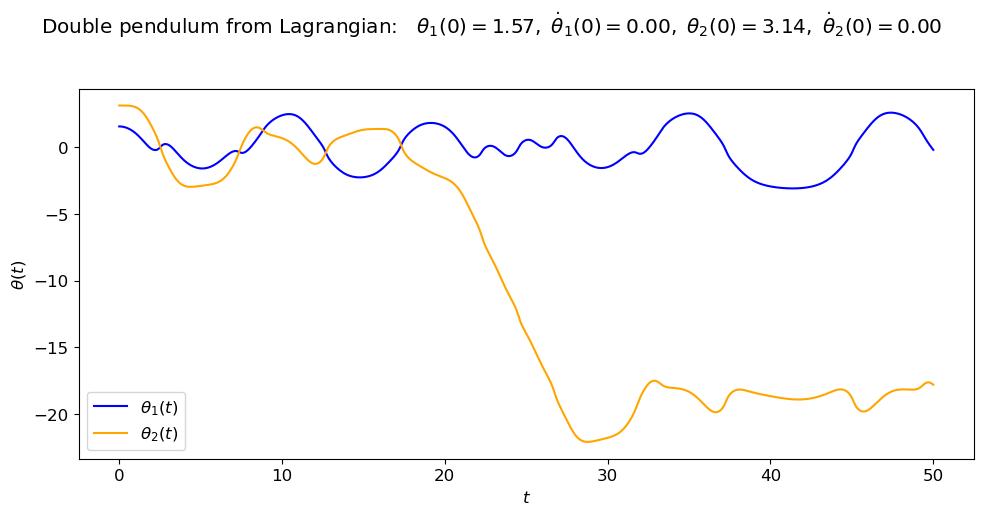

In [9]:
# now to plot

# starting the overall figure
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {θ1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {θ1dot_0:.2f},$' + \
                rf' $\theta_2(0) = {θ2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {θ2dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')
    
# plot
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], θ1[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='blue',
            title=None, 
            label=r'$\theta_1(t)$', 
            ax=ax_a)       
plot_y_vs_x(t_pts[start : stop], θ2[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='orange',
            title=None, 
            label=r'$\theta_2(t)$', 
            ax=ax_a) 

fig.tight_layout()
fig.savefig('double_pendulum_1.png', bbox_inches='tight') 

In [10]:
θ1_0 = np.pi/2.
θ2_0 = np.pi

θ1dot_0 = 0.
θ2dot_0 = 0.

θ1, θ1dot, θ2, θ2dot = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0)
θ1b, θ1dotb, θ2b, θ2dotb = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0-0.00001, θ2dot_0)

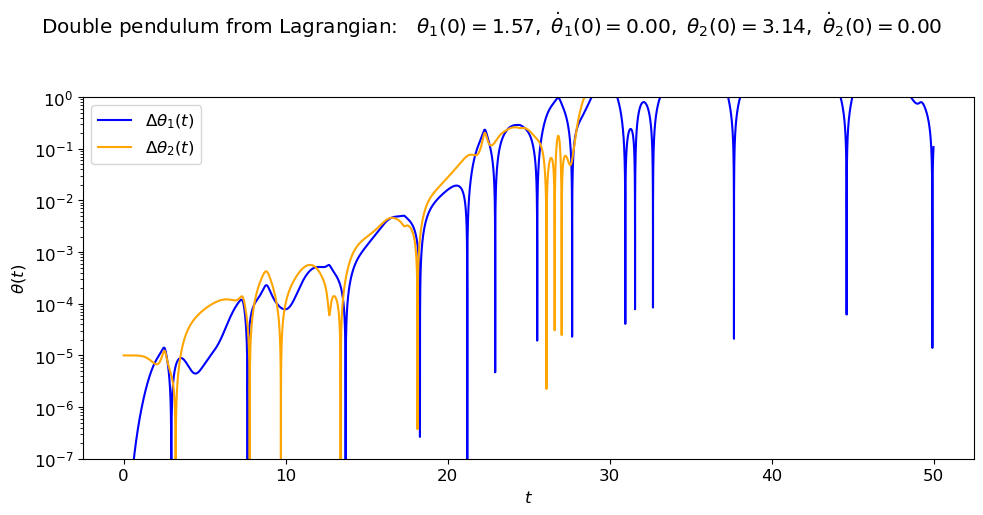

In [11]:
# now to plot

# starting the overall figure
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {θ1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {θ1dot_0:.2f},$' + \
                rf' $\theta_2(0) = {θ2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {θ2dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')
    
# plot
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], np.abs(θ1[start : stop]-θ1b[start : stop]), 
            axis_labels=θvsTimeLabels, 
            color='blue',
            semilogy=True,
            title=None, 
            label=r'$\Delta\theta_1(t)$', 
            ax=ax_a)       
plot_y_vs_x(t_pts[start : stop], np.abs(θ2[start : stop]-θ2b[start : stop]), 
            axis_labels=θvsTimeLabels, 
            color='orange',
            semilogy=True,
            title=None, 
            label=r'$\Delta\theta_2(t)$', 
            ax=ax_a) 

ax_a.set_ylim(1.e-7,1.)

fig.tight_layout()
fig.savefig('double_pendulum_2.png', bbox_inches='tight') 

In [12]:
θ1_0 = np.pi/2.
θ2_0 = 0.

θ1dot_0 = 0.
θ2dot_0 = 0.

θ1, θ1dot, θ2, θ2dot = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0)

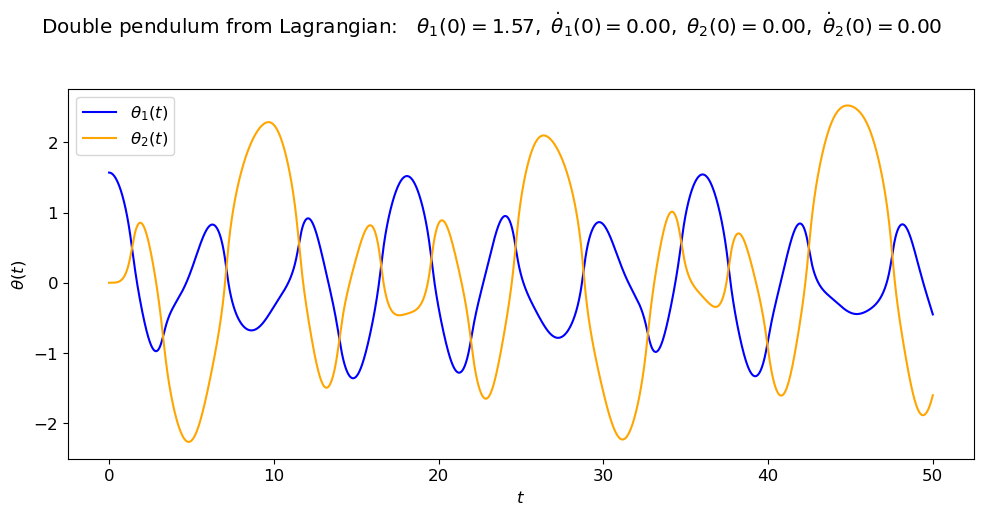

In [13]:
# now to plot

# starting the overall figure
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {θ1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {θ1dot_0:.2f},$' + \
                rf' $\theta_2(0) = {θ2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {θ2dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')
    
# plot
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], θ1[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='blue',
            title=None, 
            label=r'$\theta_1(t)$', 
            ax=ax_a)       
plot_y_vs_x(t_pts[start : stop], θ2[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='orange',
            title=None, 
            label=r'$\theta_2(t)$', 
            ax=ax_a) 

fig.tight_layout()
fig.savefig('double_pendulum_3.png', bbox_inches='tight') 

In [14]:
θ1_0 = 2.*np.pi/3.
θ2_0 = 0.

θ1dot_0 = 0.
θ2dot_0 = 0.

θ1, θ1dot, θ2, θ2dot = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0)

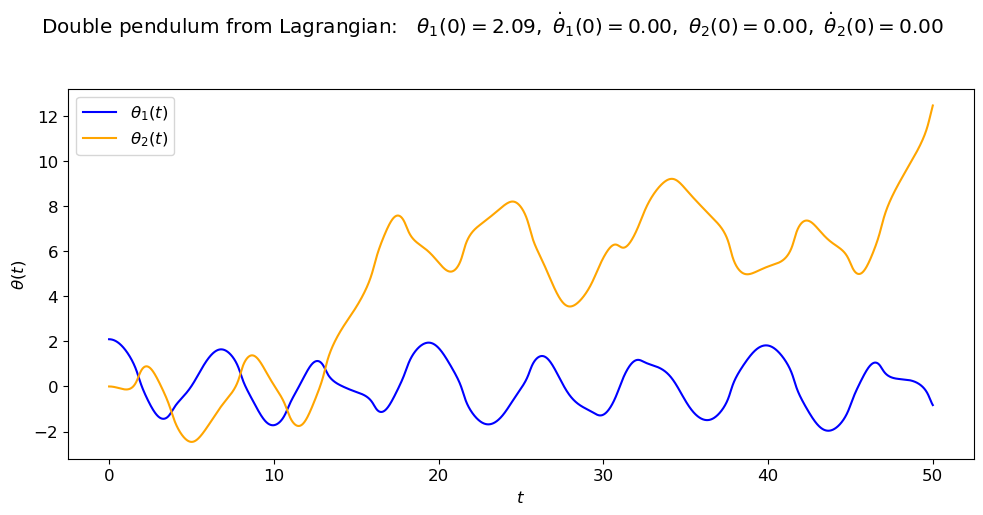

In [15]:
# now to plot

# starting the overall figure
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {θ1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {θ1dot_0:.2f},$' + \
                rf' $\theta_2(0) = {θ2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {θ2dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')
    
# plot
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], θ1[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='blue',
            title=None, 
            label=r'$\theta_1(t)$', 
            ax=ax_a)       
plot_y_vs_x(t_pts[start : stop], θ2[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='orange',
            title=None, 
            label=r'$\theta_2(t)$', 
            ax=ax_a) 

fig.tight_layout()
fig.savefig('double_pendulum_4.png', bbox_inches='tight') 

In [16]:
θ1_0 = 2.*np.pi/3.
θ2_0 = 1.

θ1dot_0 = 0.
θ2dot_0 = 0.

θ1, θ1dot, θ2, θ2dot = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0)

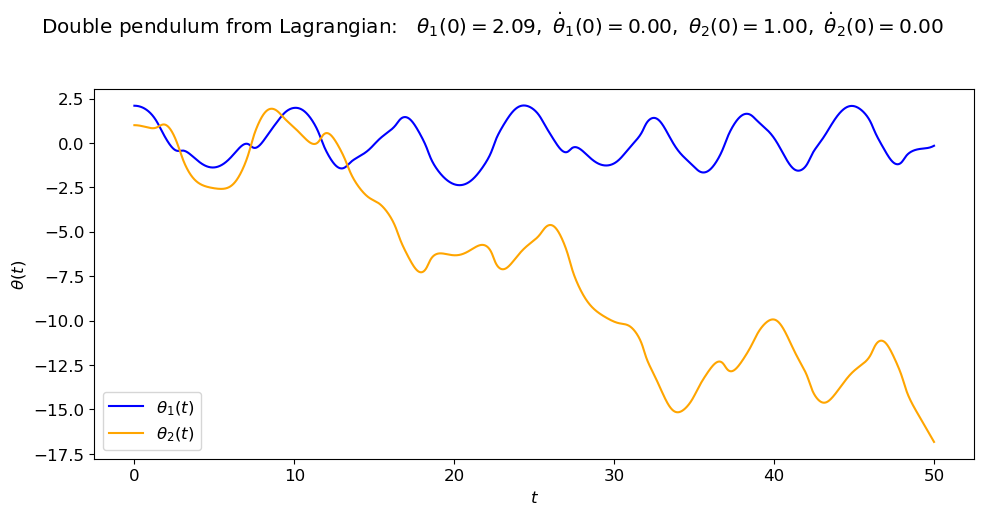

In [17]:
# now to plot

# starting the overall figure
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {θ1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {θ1dot_0:.2f},$' + \
                rf' $\theta_2(0) = {θ2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {θ2dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')
    
# plot
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], θ1[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='blue',
            title=None, 
            label=r'$\theta_1(t)$', 
            ax=ax_a)       
plot_y_vs_x(t_pts[start : stop], θ2[start : stop], 
            axis_labels=θvsTimeLabels, 
            color='orange',
            title=None, 
            label=r'$\theta_2(t)$', 
            ax=ax_a) 

fig.tight_layout()
fig.savefig('double_pendulum_4.png', bbox_inches='tight') 

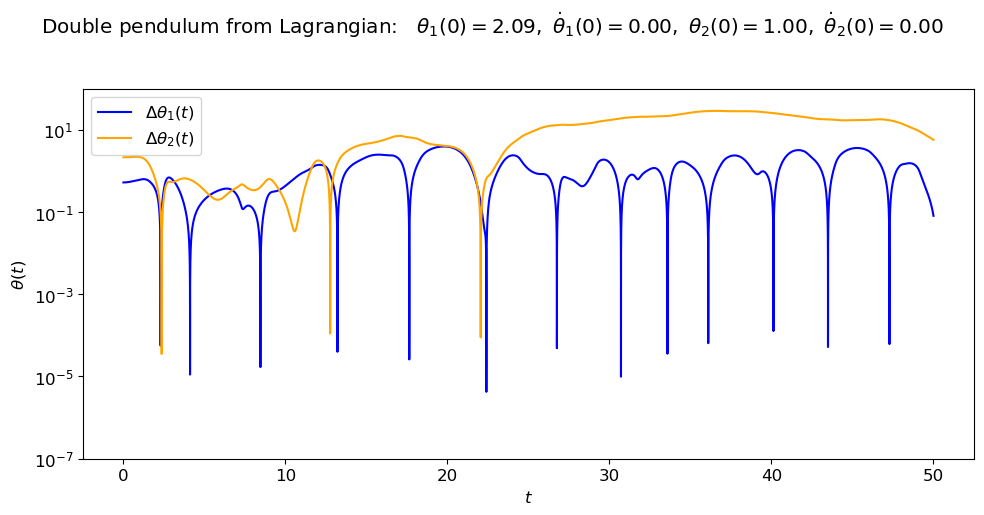

In [18]:
# now to plot

# starting the overall figure
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {θ1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {θ1dot_0:.2f},$' + \
                rf' $\theta_2(0) = {θ2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {θ2dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')
    
# plot
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], np.abs(θ1[start : stop]-θ1b[start : stop]), 
            axis_labels=θvsTimeLabels, 
            color='blue',
            semilogy=True,
            title=None, 
            label=r'$\Delta\theta_1(t)$', 
            ax=ax_a)       
plot_y_vs_x(t_pts[start : stop], np.abs(θ2[start : stop]-θ2b[start : stop]), 
            axis_labels=θvsTimeLabels, 
            color='orange',
            semilogy=True,
            title=None, 
            label=r'$\Delta\theta_2(t)$', 
            ax=ax_a) 

ax_a.set_ylim(1.e-7,100)

fig.tight_layout()
fig.savefig('double_pendulum_2.png', bbox_inches='tight')

In [19]:
def xy_coordinates (x0, y0, θ, L):
    """Convert angle theta and pendulum length L to the bob position with respect to (x0, y0)."""
    x = x0 + L*np.sin(θ)
    y = y0 - L*np.cos(θ)
    return x, y

In [20]:
t_start = 0.
t_end = 500.
delta_t = 0.1

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

θ1_0 = np.pi/2.
θ2_0 = np.pi

θ1dot_0 = 0.
θ2dot_0 = 0.

θ1b_0 = np.pi/2.
θ2b_0 = np.pi + 0.001

θ1bdot_0 = 0.
θ2bdot_0 = 0.

θ1, θ1dot, θ2, θ2dot = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0)
θ1b, θ1dotb, θ2b, θ2dotb = doublePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0-0.00001, θ2dot_0)

In [21]:
%%capture

xMin = -3.2
xMax = -xMin
yMin = -3.2
yMax = -yMin

fig_anim = plt.figure(figsize=(5,5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(xMin, xMax)
ax_anim.set_ylim(yMin, yMax)

x0, y0 = 0., 0.
pt0_anim, = ax_anim.plot(x0, y0, 
                         "o", markersize = 6, 
                         color='purple')

x1, y1 = xy_coordinates(x0, y0, θ1[0], doublePendulum1.L1)
pt1_anim, = ax_anim.plot(x1, y1, 
                         "o", markersize=12, 
                         color='blue')
ln1_anim, = ax_anim.plot([x0, x1], [y0, y1], color='blue', lw=3)
x2, y2 = xy_coordinates(x1, y1, θ2[0], doublePendulum1.L2)
pt2_anim, = ax_anim.plot(x2, y2, 
                         "o", markersize=12, 
                         color='blue')
ln2_anim, = ax_anim.plot([x1, x2], [y1, y2], color='blue', lw=3)

x1b, y1b = xy_coordinates(x0, y0, θ1b[0], doublePendulum1.L1)
pt1b_anim, = ax_anim.plot(x1b, y1b, 
                          "o", markersize=12, 
                          color='orange')
ln1b_anim, = ax_anim.plot([x0, x1b], [y0, y1b], color='orange', lw=3)
x2b, y2b = xy_coordinates(x1b, y1b, θ2b[0], doublePendulum1.L2)
pt2b_anim, = ax_anim.plot(x2b, y2b, 
                          "o", markersize=12, 
                          color='orange')
ln2b_anim, = ax_anim.plot([x1b, x2b], [y1b, y2b], color='orange', lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')                  
fig_anim.tight_layout()

In [22]:
def animatePendulum(i):
    """This is the function called by FuncAnimation to create each frame,
        numbered by i.  So each i corresponds to a point in the t_pts
        array, with index i.
    """
    i_skip = 2*i
    
    x0, у0 = 0., 0.
    pt0_anim.set_data(x0, y0)
    
    x1, y1 = xy_coordinates(x0, y0, θ1[i_skip], doublePendulum1.L1)
    pt1_anim.set_data(x1, y1)
    ln1_anim.set_data([x0, x1], [y0, y1])
    x2, y2 = xy_coordinates(x1, y1, θ2[i_skip], doublePendulum1.L2) 
    pt2_anim.set_data(x2, y2)
    ln2_anim.set_data([x1, x2], [y1, y2])
    
    x1b, y1b = xy_coordinates (x0, y0, θ1b[i_skip], doublePendulum1.L1)
    pt1b_anim.set_data(x1b, y1b)
    ln1b_anim.set_data([x0, x1b], [y0, y1b])
    x2b, y2b = xy_coordinates(x1b, y1b, θ2b[i_skip], doublePendulum1.L2)
    pt2b_anim.set_data(x2b, y2b)
    ln2b_anim.set_data([x1b, x2b], [y1b, y2b])
                          
    return (pt0_anim, pt1_anim, ln1_anim, pt2_anim, ln2_anim, pt1b_anim, ln1b_anim, pt2b_anim, ln2b_anim)

In [23]:
frame_interval = 20.  # time between frames
frame_number = 1001    # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animatePendulum, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

In [24]:
HTML(anim.to_jshtml())

## Now onto the Triple Pendulum

Note: this is a pretty brief and rough attempt done mostly out of curiosity, but I decided to spend the bulk of my time on the assignment on other things

The position equations follow as:
   -  $x_1 = L_1 sin \theta_1$
   -  $y_1 = L_1 cos \theta_1$
   -  $x_2 = x_1 + L_2 sin \theta_2 = L_1 sin \theta_1 + L_2 sin \theta_2$
   -  $y_2 = y_1 + L_2 cos \theta_2 = L_1 cos \theta_1 + L_2 cos \theta_2$
   -  $x_3 = x_2 + L_3 sin \theta_3 = L_1 sin \theta_1 + L_2 sin \theta_2 + L_3 sin \theta_3$
   -  $y_3 = y_2 +  L_3 cos \theta_3 = L_1 cos \theta_1 + L_2 cos \theta_2 + L_3 cos \theta_3$
     
The velocity equations are then:
   -  $\dot x_1 = L_1 \dot\theta_1 cos \theta_1$
   -  $\dot y_1 = -L_1 \dot\theta_1 sin \theta_1$
   - $\dot x_2 = \dot x_1 + L_2 \dot\theta_2 cos \theta_2 = L_1 \dot\theta_1 cos \theta_1 + L_2 \dot\theta_2 cos \theta_2$
   - $\dot y_2 = \dot y_1 + -L_2 \dot\theta_2 sin \theta_2 = -L_1 \dot\theta_1 sin \theta_1 - L_2 \dot\theta_2 sin \theta_2$
   -$\dot x_3 = \dot x_2 + L_3 \dot\theta_3 cos \theta_3 = L_1 \dot\theta_1 sin \theta_1 - L_2 \dot\theta_2 sin \theta_2 + L_3 \dot\theta_3 cos \theta_3 $
   +$\dot y_3 = \dot y_2 + \dot\theta_3 L_3 cos \theta_3 = -L_1 \dot\theta_1 sin \theta_1 - L_2 \dot\theta_2 sin \theta_2 + \dot\theta_3 L_3  cos \theta_3$

In [29]:
class TriplePendulum():
    """
    Pendulum class implements the parameters and Lagrange's equations for 
     a simple pendulum (no driving or damping).
     
    Parameters
    ----------
    L1 : float
        length of the first pendulum
    L2 : float
        length of the second pendulum
    L3 : float
        length of the third pendulum
    g : float
        gravitational acceleration at the earth's surface
    mn : float
        mass of pendulum, n is for pendulum number

    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y. 
        Differential equation: [dθ1/dt dθ1dot/dt dθ2/dt dθ2dot/dt]
        Returns: θ1dot, z1dot, θ2dot, z2dot
        
    solveODE 
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        Returns: θ1, θ1dot, θ2, θ2dot
        
    totalEnergy
        Return total energy of the system: T+U
    
    """
    def __init__(self, L1=1., L2 =1., L3 = 1., m1=1., m2=1., m3=1., g=1.
                ):
        self.L1 = L1
        self.L2 = L2
        self.L3 = L3
        self.g = g
        self.m1 = m1
        self.m2 = m2
        self.m3 = m3
    
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dθ1/dt dθ1dot/dt dθ2/dt dθ2dot/dt]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 6-component vector with:
                y[0] = θ(t) and y[1] = dθ1dot/dt
                y[2] = θ(t) and y[3] = dθ2dot/dt
                y[4] = θ(t) and y[5] = dθ2dot/dt
            
        Returns
        -------
        θ1dot, z1dot, θ2dot, z2dot, θ3dot, z3dot
        
        """
        θ1, z1, θ2, z2, θ3, z3 = y
        c, s = np.cos(θ1-θ2), np.sin(θ1-θ2)
        denominator = (self.m1 + self.m2*s**2+self.m3*s**2)
        
        θ1dot = z1
        θ2dot = z2
        θ3dot = z3
        
        z1dot = ((self.m2+self.m3)*self.g*np.sin(θ2)*c - (self.m2+self.m3)*s*(self.L1*z1**2*c+self.L2*z2**2) \
                - (self.m1 + self.m2 + self.m3) * self.g * np.sin(θ1))/self.L1/denominator
        z2dot = ((self.m1+self.m2+self.m3)*(self.L1*z1**2*s - self.g*np.sin(θ2) + self.g*np.sin(θ1)*c) \
                +self.m2*self.L2*z2**2*s*c)/self.L2/denominator
        # not sure that it's correctly edited below
        z3dot = ((self.m1+self.m2+self.m3)*(self.L3*z1**2*s - self.g*np.sin(θ3) + self.g*np.sin(θ2)*c) \
                +(self.m2+self.m3)*self.L3*z2**2*s*c)/self.L2/denominator
        return θ1dot, z1dot, θ2dot, z2dot, θ3dot, z3dot
    
    def solveODE(self, t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0, 
                  abserr=1.0e-6, relerr=1.0e-6):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        
        Returns
        -------
        θ1, θ1dot, θ2, θ2dot
        
        """
        y = [θ1_0, θ1dot_0, θ2_0, θ2dot_0, θ3_0, θ3dot_0] 
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        θ1, θ1dot, θ2, θ2dot, θ3, θ3dot = solution.y

        return θ1, θ1dot, θ2, θ2dot, θ3, θ3dot
    
    
    # still needs to be edited
    def totalEnergy(y):
        """"Return total energy of the system: T+U """""
        θ1, θ1dot, θ2, θ2dot, θ3, θ3dot = y.T
        U = -(m1+m2+m3)*L1*g*np.cos(θ1) - m2*L2*g*np.cos(θ2) + - m3*L3*g*np.cos(θ3)
        T = 0.5*m1*(L1*θ1dot)**2 + 0.5*m2((L1*θ1dot)**2) + 0.5*m3((L2*θ2dot)**2) + 2*L1*L2*L3*θ1dot*θ2dot*θ3dot*np.cos(θ1-θ2-θ3)
        
        return T + U

In [26]:
L3 = 1.
m3 = 1.

triplePendulum1 = TriplePendulum(L1=L1,L2=L2,L3=L3,m1=m1,m2=m2,m3=m3,g=g)

In [41]:
t_start = 0.
t_end = 50.
delta_t = 0.05

t_pts = np.arange(t_start, t_end+delta_t, delta_t)

θ1_0 = np.pi/2.
θ2_0 = np.pi
θ3_0 = np.pi/2.

θ1dot_0 = 0.
θ2dot_0 = 0.
θ3dot_0 = 0.

θ1b_0 = np.pi/2.
θ2b_0 = np.pi + 0.001
θ3b_0 = np.pi + 0.01

θ1bdot_0 = 0.
θ2bdot_0 = 0.
θ3bdot_0 = 0.

θ1, θ1dot, θ2, θ2dot, θ3, θ3dot = triplePendulum1.solveODE(t_pts, θ1_0, θ1dot_0, θ2_0, θ2dot_0, θ3_0, θ3dot_0)
θ1b, θ1dotb, θ2b, θ2dotb, θ3b, θ3dotb = triplePendulum1.solveODE(t_pts, θ1b_0, θ1bdot_0, θ2b_0, θ2bdot_0, θ3b_0, θ3bdot_0)

In [32]:
%%capture

xMin = -3.2
xMax = -xMin
yMin = -3.2
yMax = -yMin

fig_anim = plt.figure(figsize=(5,5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(xMin, xMax)
ax_anim.set_ylim(yMin, yMax)

x0, y0 = 0., 0.
pt0_anim, = ax_anim.plot(x0, y0, 
                         "o", markersize = 6, 
                         color='purple')

x1, y1 = xy_coordinates(x0, y0, θ1[0], triplePendulum1.L1)
pt1_anim, = ax_anim.plot(x1, y1, 
                         "o", markersize=12, 
                         color='blue')
ln1_anim, = ax_anim.plot([x0, x1], [y0, y1], color='blue', lw=3)
x2, y2 = xy_coordinates(x1, y1, θ2[0], triplePendulum1.L2)
pt2_anim, = ax_anim.plot(x2, y2, 
                         "o", markersize=12, 
                         color='blue')
ln2_anim, = ax_anim.plot([x1, x2], [y1, y2], color='blue', lw=3)
x3, y3 = xy_coordinates(x2, y2, θ3[0], triplePendulum1.L3)
pt3_anim, = ax_anim.plot(x3, y3, 
                         "o", markersize=12, 
                         color='blue')
ln3_anim, = ax_anim.plot([x2, x3], [y2, y3], color='blue', lw=3)

x1b, y1b = xy_coordinates(x0, y0, θ1b[0], triplePendulum1.L1)
pt1b_anim, = ax_anim.plot(x1b, y1b, 
                          "o", markersize=12, 
                          color='orange')
ln1b_anim, = ax_anim.plot([x0, x1b], [y0, y1b], color='orange', lw=3)
x2b, y2b = xy_coordinates(x1b, y1b, θ2b[0], triplePendulum1.L2)
pt2b_anim, = ax_anim.plot(x2b, y2b, 
                          "o", markersize=12, 
                          color='orange')
ln2b_anim, = ax_anim.plot([x1b, x2b], [y1b, y2b], color='orange', lw=3)
x3b, y3b = xy_coordinates(x2b, y2b, θ3b[0], triplePendulum1.L3)
pt3b_anim, = ax_anim.plot(x3b, y3b, 
                          "o", markersize=12, 
                          color='orange')
ln3b_anim, = ax_anim.plot([x2b, x3b], [y2b, y3b], color='orange', lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')                  
fig_anim.tight_layout()

In [33]:
def animatePendulum(i):
    """This is the function called by FuncAnimation to create each frame,
        numbered by i.  So each i corresponds to a point in the t_pts
        array, with index i.
    """
    i_skip = 2*i
    
    x0, у0 = 0., 0.
    pt0_anim.set_data(x0, y0)
    
    x1, y1 = xy_coordinates(x0, y0, θ1[i_skip], triplePendulum1.L1)
    pt1_anim.set_data(x1, y1)
    ln1_anim.set_data([x0, x1], [y0, y1])
    x2, y2 = xy_coordinates(x1, y1, θ2[i_skip], triplePendulum1.L2) 
    pt2_anim.set_data(x2, y2)
    ln2_anim.set_data([x1, x2], [y1, y2])
    x3, y3 = xy_coordinates(x2, y2, θ3[i_skip], triplePendulum1.L3) 
    pt3_anim.set_data(x3, y3)
    ln3_anim.set_data([x2, x3], [y2, y3])
    
    x1b, y1b = xy_coordinates (x0, y0, θ1b[i_skip], triplePendulum1.L1)
    pt1b_anim.set_data(x1b, y1b)
    ln1b_anim.set_data([x0, x1b], [y0, y1b])
    x2b, y2b = xy_coordinates(x1b, y1b, θ2b[i_skip], triplePendulum1.L2)
    pt2b_anim.set_data(x2b, y2b)
    ln2b_anim.set_data([x1b, x2b], [y1b, y2b])
    x3b, y3b = xy_coordinates(x2b, y2b, θ3b[i_skip], triplePendulum1.L3)
    pt3b_anim.set_data(x3b, y3b)
    ln3b_anim.set_data([x2b, x3b], [y2b, y3b])
    
                          
    return (pt0_anim, pt1_anim, ln1_anim, pt2_anim, ln2_anim, pt3_anim, 
            ln3_anim, pt1b_anim, ln1b_anim, pt2b_anim, ln2b_anim, pt3b_anim, ln3b_anim)

In [42]:
frame_interval = 40.  # time between frames
frame_number = 500 # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animatePendulum, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

In [43]:
HTML(anim.to_jshtml())